# Face Identification Using DLIM
This notebook uses [DLIB](http://dlib.net/imaging.html) face detector.


## Prerequesites
Install the dlib library:
```
brew install cmake
pip install dlib
```

Download the models from below locations to ../input/dlib_models folder:
```
http://dlib.net/files/mmod_human_face_detector.dat.bz2
http://dlib.net/files/shape_predictor_5_face_landmarks.dat.bz2
http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
```


In [2]:
%load_ext autoreload
%autoreload 2

In [4]:
import cv2
import tensorflow as tf
import numpy as np
import dlib
from matplotlib import pyplot as plt
import matplotlib.patches as patches
import preprocessor
import configuration
import viz
import glob
import random
import time
import statistics

preproc = preprocessor.PreProcessor()
config = configuration.Configuration()
vizualizer = viz.Vizualizer()

In [5]:
def infer(ax, model, image_file):
    image = dlib.load_rgb_image(image_file)
    image = preproc.increase_brightness(image)
    start = time.process_time()
    # The 1 in the second argument indicates that we should upsample the image
    # 1 time.  This will make everything bigger and allow us to detect more
    # faces.
    predictions = model(image, 1)
    time_taken = time.process_time() - start
    
    for i, d in enumerate(predictions):        
        confidence = d.confidence
        x = d.rect.left()
        y = d.rect.top()
        w = d.rect.right() - d.rect.left()
        h = d.rect.bottom() - d.rect.top()        
        rect = patches.Rectangle((x,y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    ax.imshow(image)
    # ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    return time_taken
    

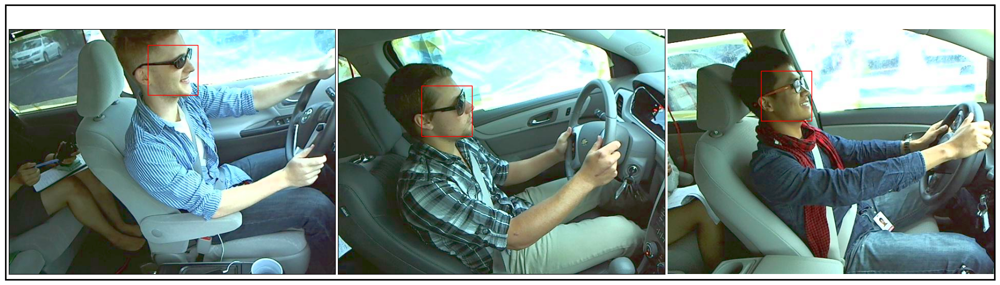

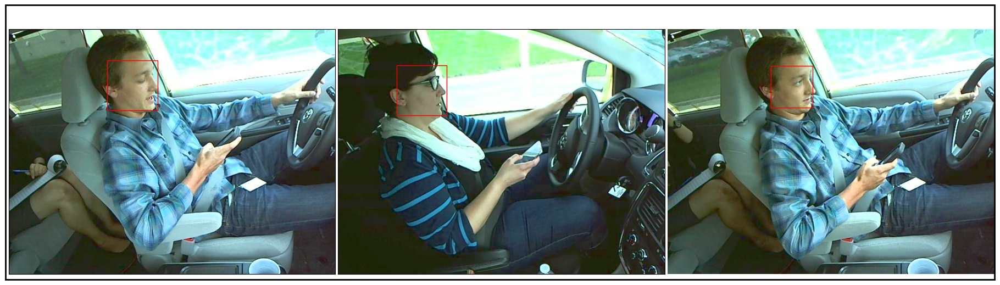

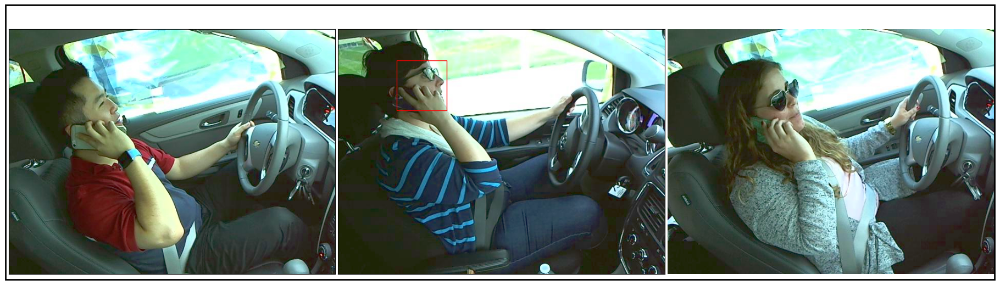

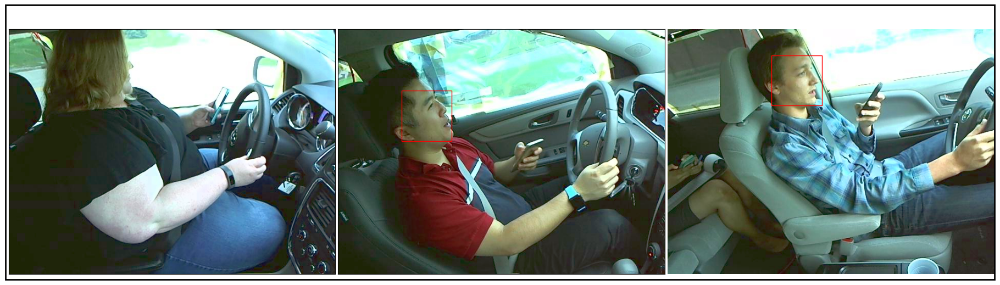

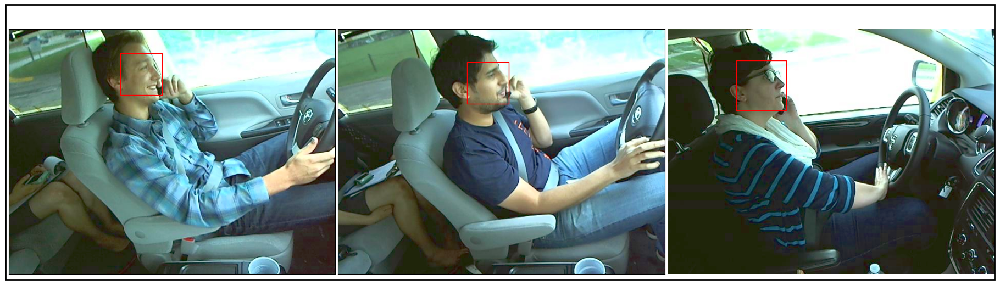

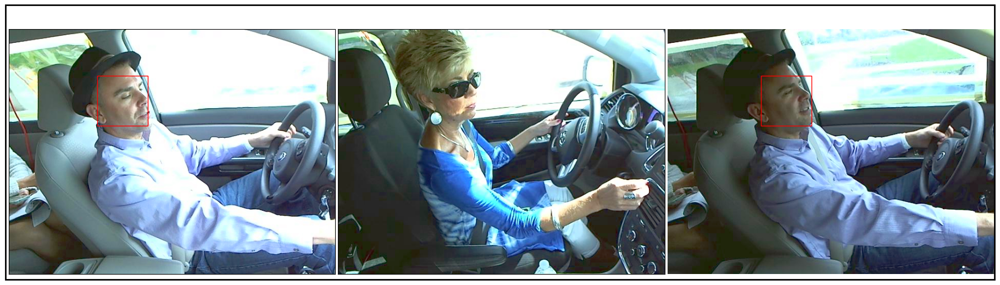

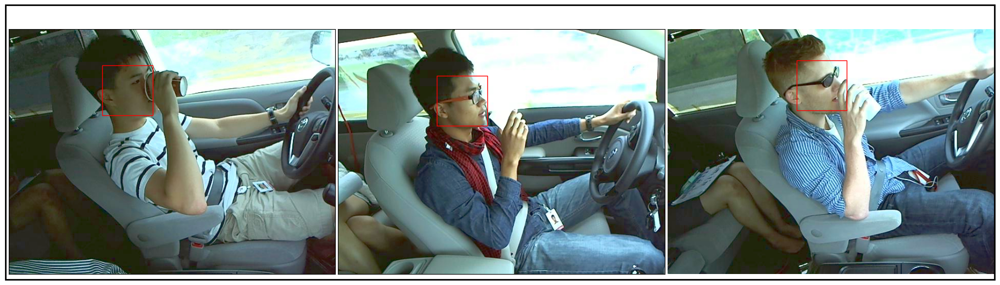

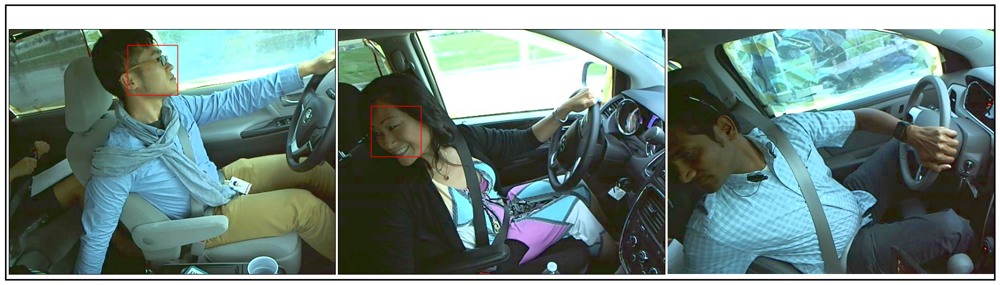

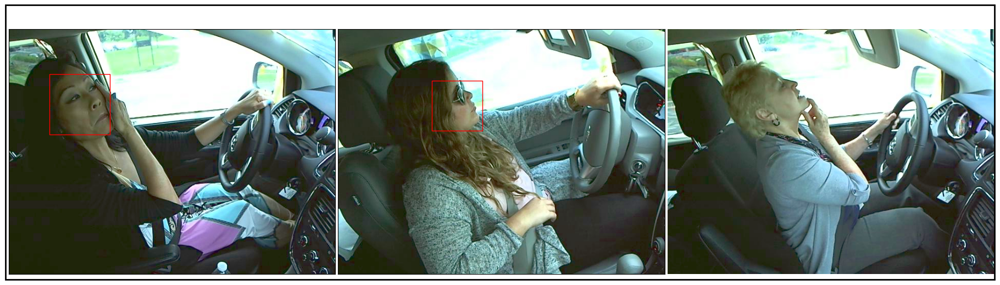

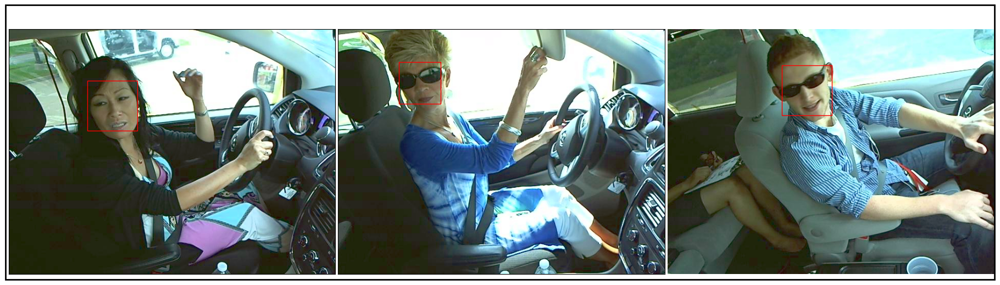

Average time for inference:4.965227333333329 seconds
Anticipated preprocessing time for training dataset of 22,000:1820.5833555555541 mins


In [7]:
model_file = f'{config.DLIB_MODELS_FOLDER}/mmod_human_face_detector.dat'
model = dlib.cnn_face_detection_model_v1(model_file)
times = []
for cur_class in range(len(config.class_dict)):
    new_times = vizualizer.infer_and_plot(model, infer, config.class_dict[cur_class], 
                                          f'{config.IMAGES_BASE}/c{cur_class}', 
                                          num_images=3, cols=3, plt_width=18, plt_height=5)
    times = [*times, *new_times]

print(f'Average time for inference:{statistics.mean(times)} seconds')
print(f'Anticipated preprocessing time for training dataset of 22,000:{22000 * statistics.mean(times) / 60} mins')
